In [ ]:
import yfinance as yf
import pandas as pd

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from statsmodels.tsa.stattools import adfuller, acf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import shapiro, norm, probplot
from statsmodels.stats.diagnostic import acorr_ljungbox
import warnings
warnings.filterwarnings('ignore')
import mplfinance as mpf

In [ ]:
# Developed Market Indices
developed_indices = [
    {"Country": "US", "Index": "^GSPC"},  # S&P 500
    {"Country": "CANADA", "Index": "^GSPTSE"},  # TSX
    {"Country": "UK", "Index": "^FTSE"},  # FTSE 100
    {"Country": "GERMANY", "Index": "^GDAXI"},  # DAX
    {"Country": "JAPAN", "Index": "^N225"},  # Nikkei 225
    {"Country": "AUSTRALIA", "Index": "^AXJO"},  # ASK
]

In [ ]:
# Emerging Market Indices
emerging_indices = [
    {"Country": "BRAZIL", "Index": "^BVSP"},  # BOVESPA
    {"Country": "CHILE", "Index": "^IGPA"},  # IGPA
    {"Country": "GREECE", "Index": "ASE"},  # ASE
    {"Country": "QATAR", "Index": "^QSI"},  # QE General
    {"Country": "CHINA", "Index": "000001.SS"},  # SSE Composite
    {"Country": "INDIA", "Index": "^BSESN"},  # Sensex
]

In [ ]:
developed_df = pd.DataFrame()
emerging_df = pd.DataFrame()
frontier_df = pd.DataFrame()

In [ ]:
# Fetch data for each index in Developed Market
for item in developed_indices:
    symbol = item["Index"]
    try:
        # Download historical data
        data = yf.download(symbol, start="2000-01-01", end="2025-01-01", progress=False,auto_adjust=True)
        if not data.empty:
            # Add Ticker column
            data["Ticker"] = symbol
            data.reset_index(inplace=True)  # Reset the index to make 'Date' a column
            # Select only the required columns
            data = data[["Date", "Ticker", "Open", "Close", "High", "Low", "Volume"]]
            data.columns = ["Date", "Ticker", "Open", "Close", "High", "Low", "Volume"]
            # Append data vertically
            developed_df = pd.concat([developed_df, data], ignore_index=True)
    except Exception as e:
        print(f"Error fetching data for {symbol}: {e}")


print("Developed Market DataFrame:")
(developed_df.head())


Developed Market DataFrame:


,Date,Ticker,Open,Close,High,Low,Volume
0,2000-01-03,^GSPC,1469.250000,1455.219971,1478.000000,1438.359985,931800000
1,2000-01-04,^GSPC,1455.219971,1399.420044,1455.219971,1397.430054,1009000000
2,2000-01-05,^GSPC,1399.420044,1402.109985,1413.270020,1377.680054,1085500000
3,2000-01-06,^GSPC,1402.109985,1403.449951,1411.900024,1392.099976,1092300000
4,2000-01-07,^GSPC,1403.449951,1441.469971,1441.469971,1400.729980,1225200000


In [ ]:
# Fetch data for each index in Emerging Market
for item in emerging_indices:
    symbol = item["Index"]
    try:
        # Download historical data
        data = yf.download(symbol, start="2000-01-01", end="2025-01-01", progress=False,auto_adjust=True)
        if not data.empty:
            # Add Ticker column
            data["Ticker"] = symbol
            data.reset_index(inplace=True)  # Reset the index to make 'Date' a column
            # Select only the required columns
            data = data[["Date", "Ticker", "Open", "Close", "High", "Low", "Volume"]]
            data.columns = ["Date", "Ticker", "Open", "Close", "High", "Low", "Volume"]
            # Append data vertically
            emerging_df = pd.concat([emerging_df, data], ignore_index=True)
    except Exception as e:
        print(f"Error fetching data for {symbol}: {e}")

print("Emerging Market DataFrame:")
(emerging_df.head())

Emerging Market DataFrame:


,Date,Ticker,Open,Close,High,Low,Volume
0,2000-01-03,^BVSP,17098.0,16930.0,17408.0,16719.0,0
1,2000-01-04,^BVSP,16908.0,15851.0,16908.0,15851.0,0
2,2000-01-05,^BVSP,15871.0,16245.0,16302.0,15350.0,0
3,2000-01-06,^BVSP,16237.0,16107.0,16499.0,15977.0,0
4,2000-01-07,^BVSP,16125.0,16309.0,16449.0,16125.0,0


In [ ]:
import pandas as pd

developed_df['Date'] = pd.to_datetime(developed_df['Date'])

In [ ]:
import datetime

In [ ]:
emerging_df['Ticker'].value_counts()

,count
Ticker,
^BVSP,6191
^BSESN,6162
000001.SS,6052
^IGPA,5229
^QSI,4973
ASE,1953



 Analyzing ^GSPC


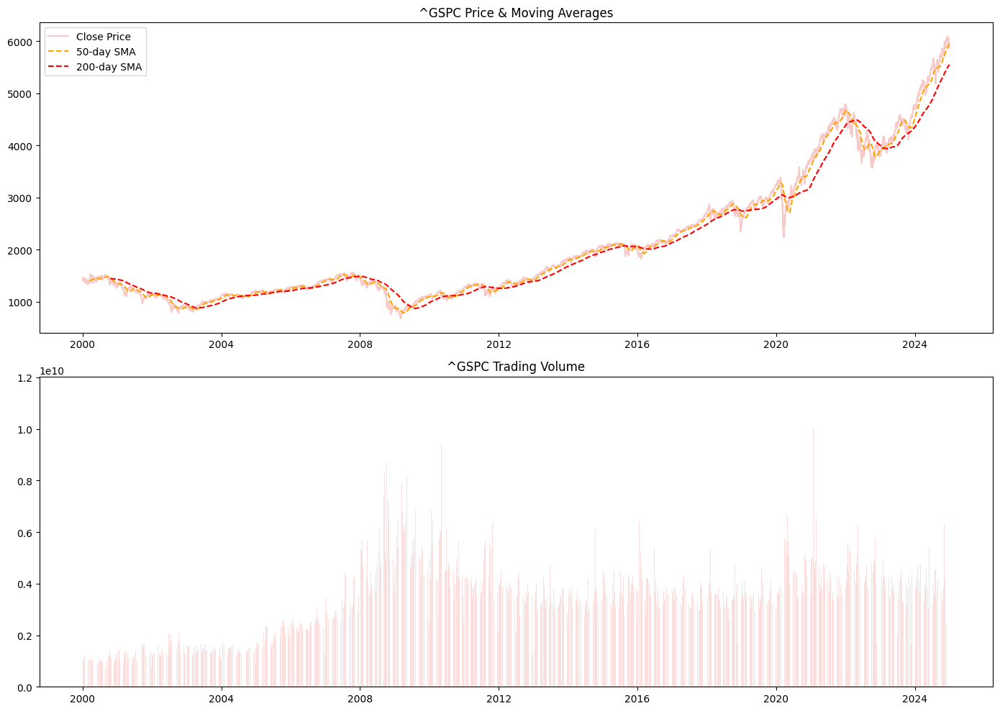

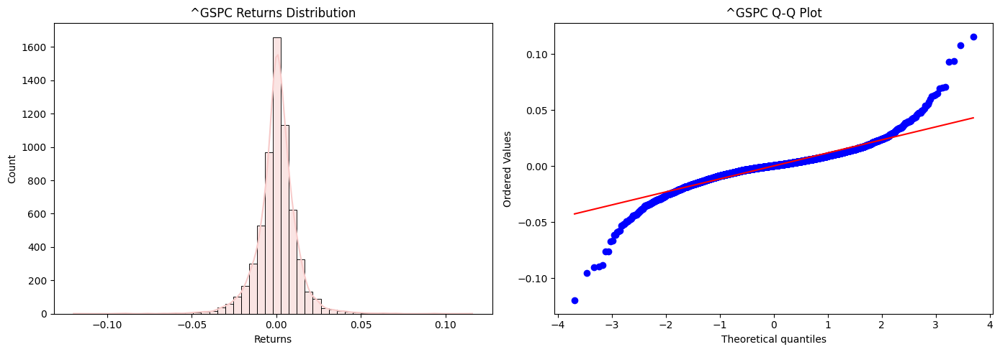

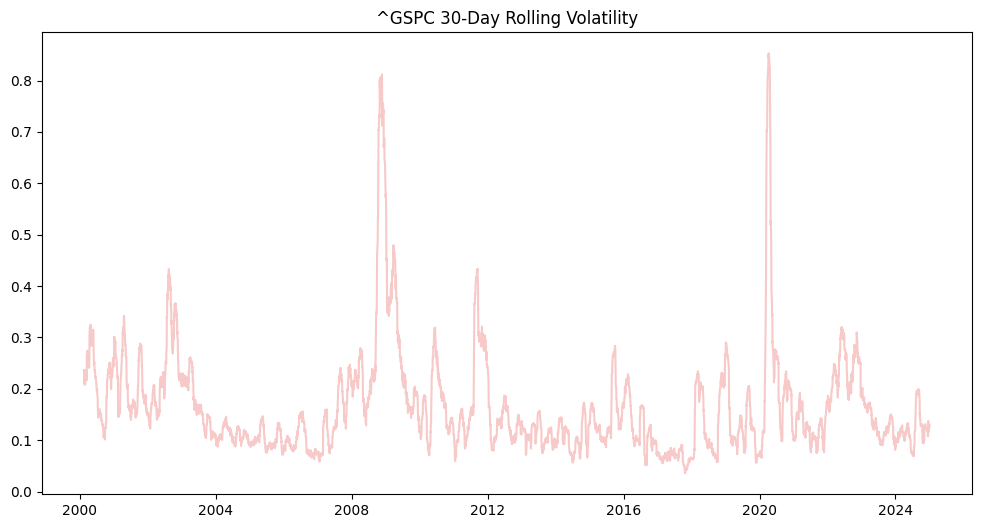

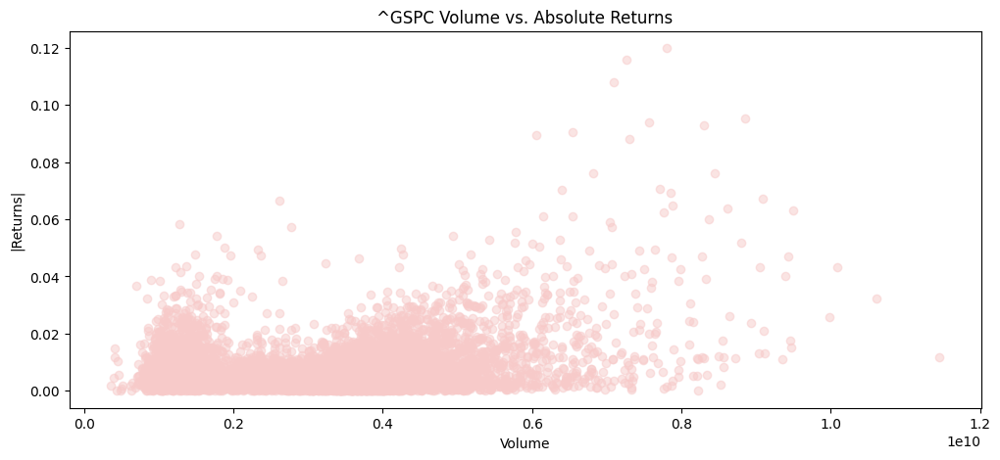

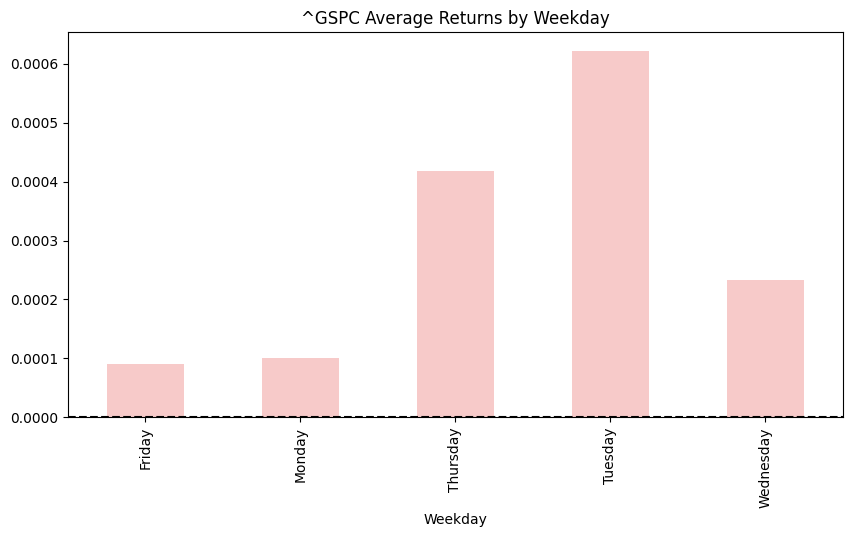


----------------------------------------
^GSPC Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=2.71, p=0.9991

Shapiro-Wilk Test:
Stat=0.90, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0000

 Analyzing ^GSPTSE


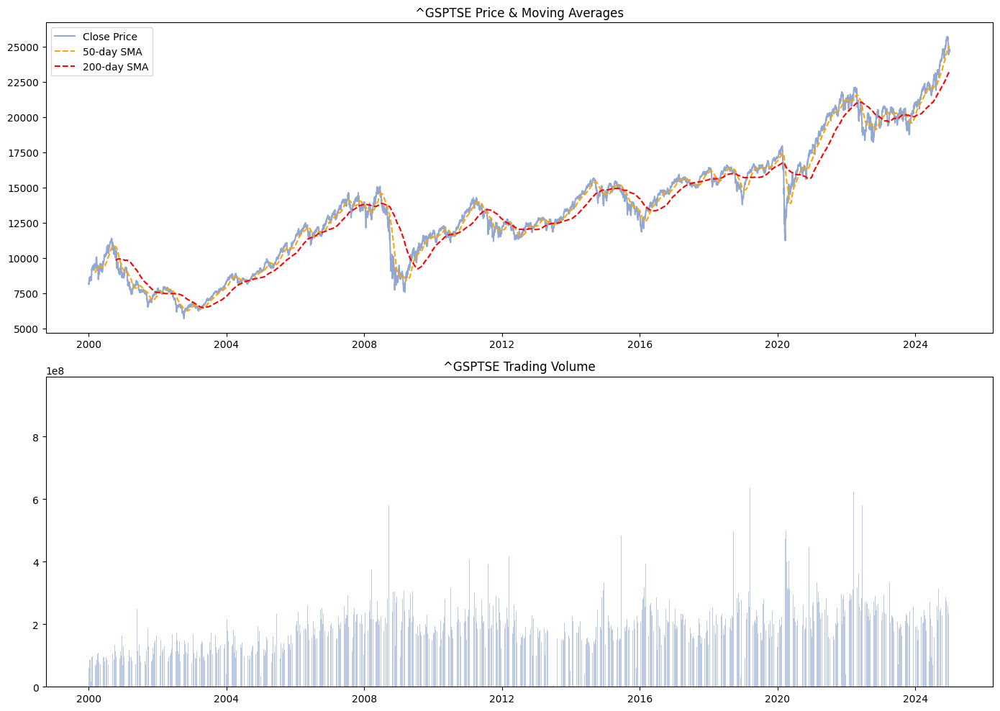

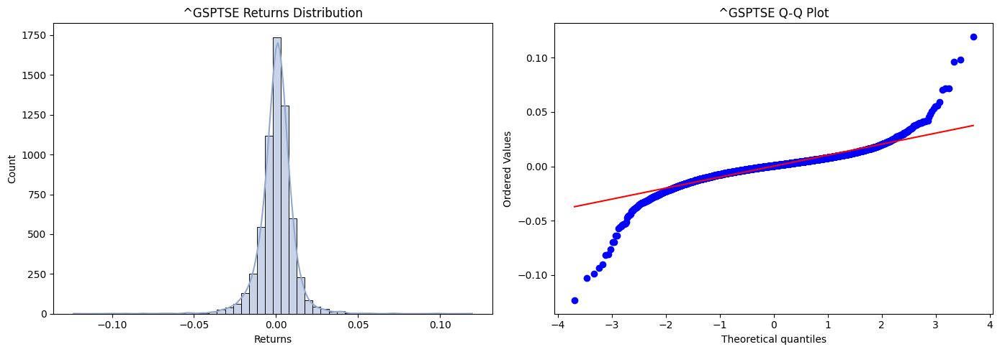

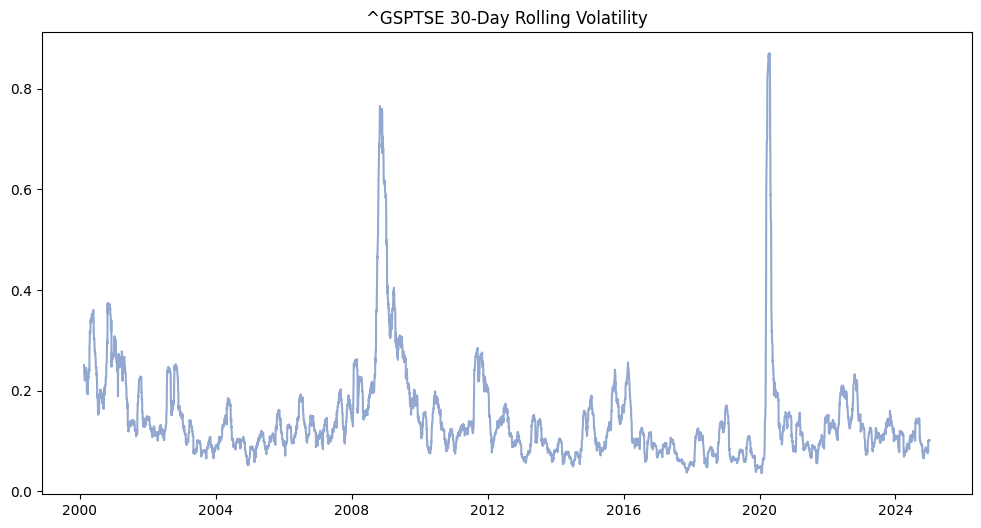

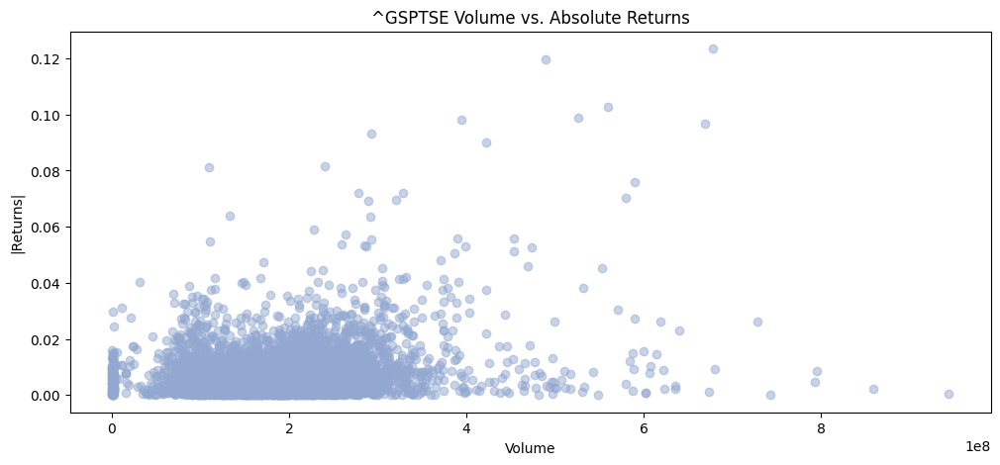

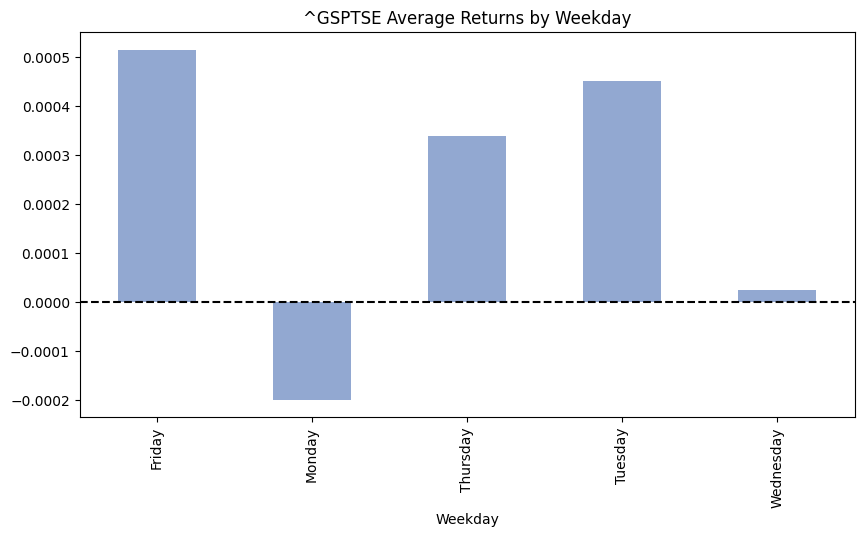


----------------------------------------
^GSPTSE Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=0.24, p=0.9744

Shapiro-Wilk Test:
Stat=0.87, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0000

 Analyzing ^FTSE


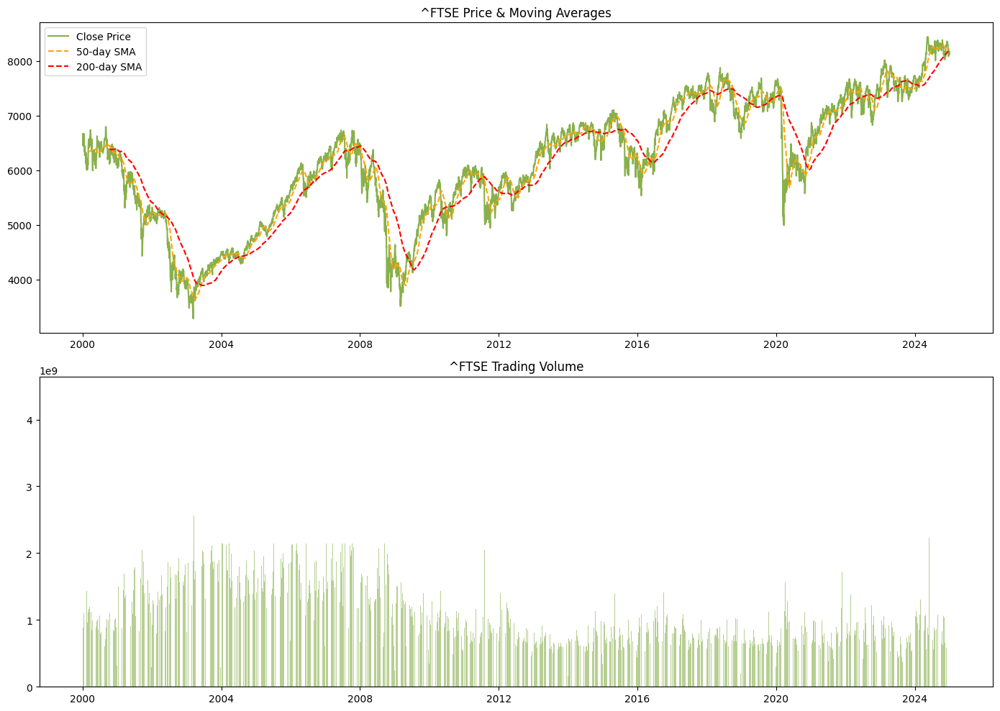

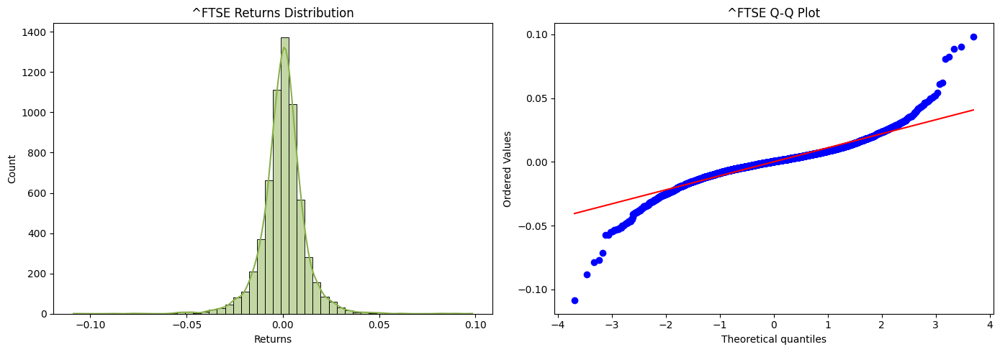

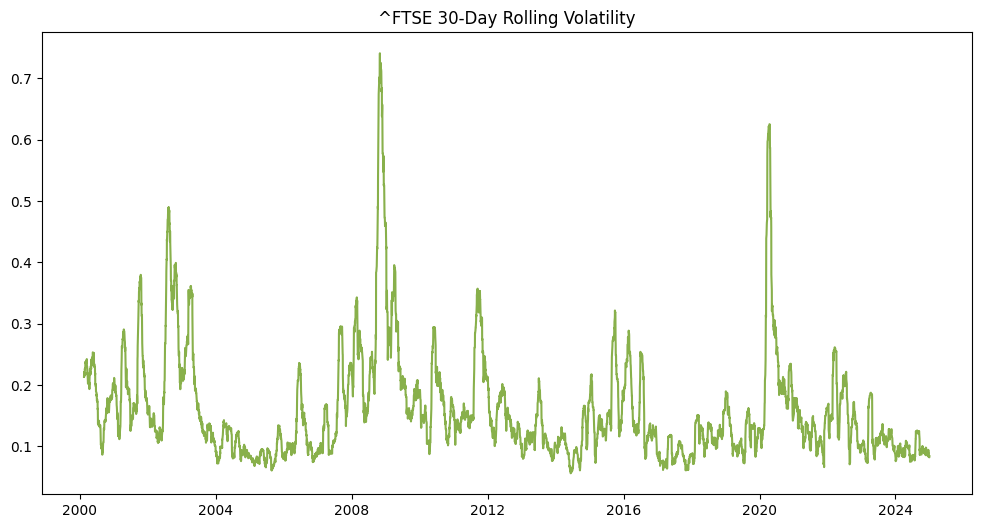

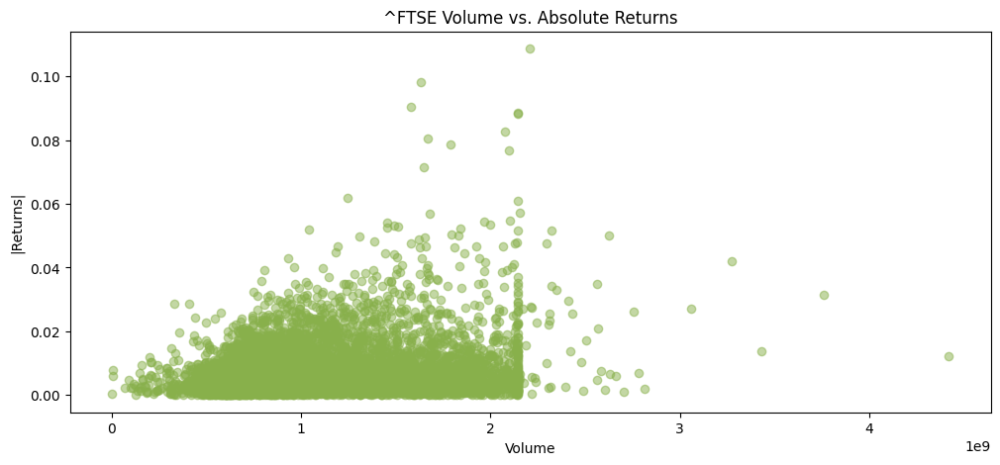

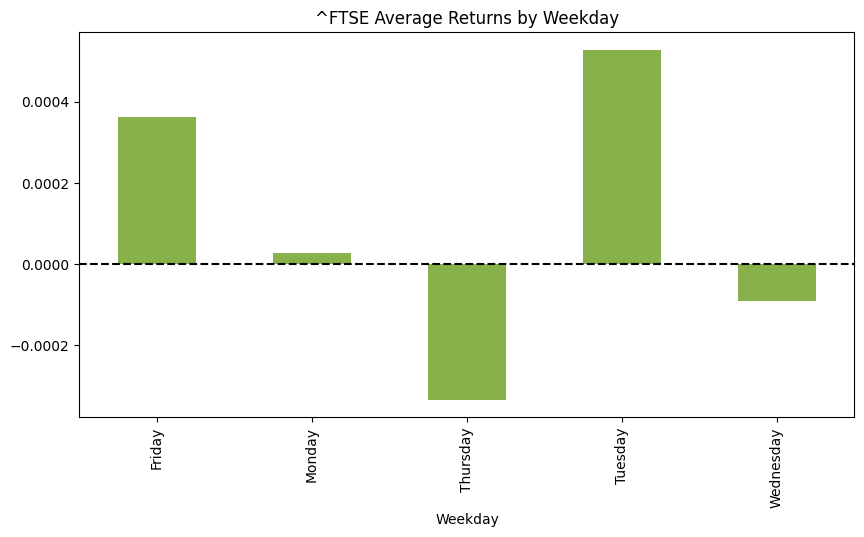


----------------------------------------
^FTSE Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=-1.39, p=0.5874

Shapiro-Wilk Test:
Stat=0.92, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0000

 Analyzing ^GDAXI


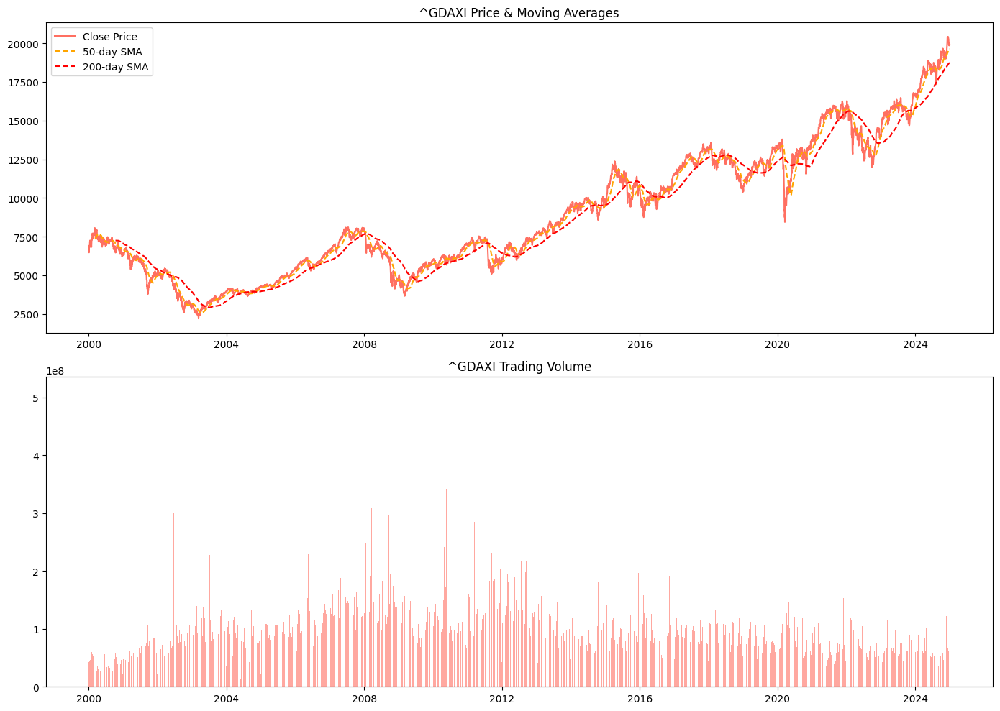

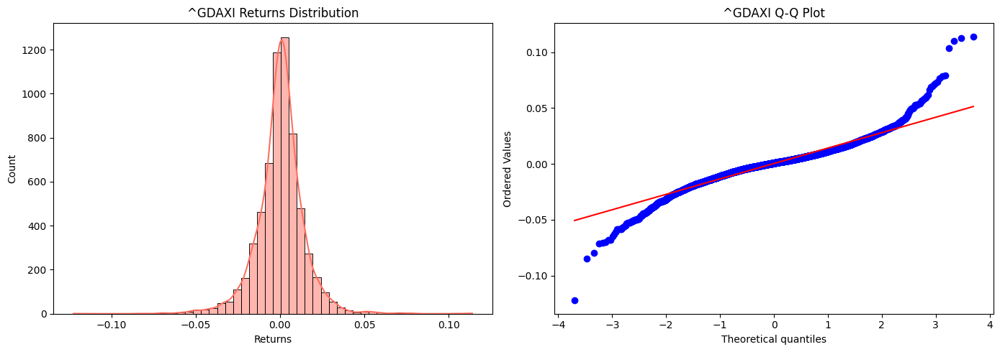

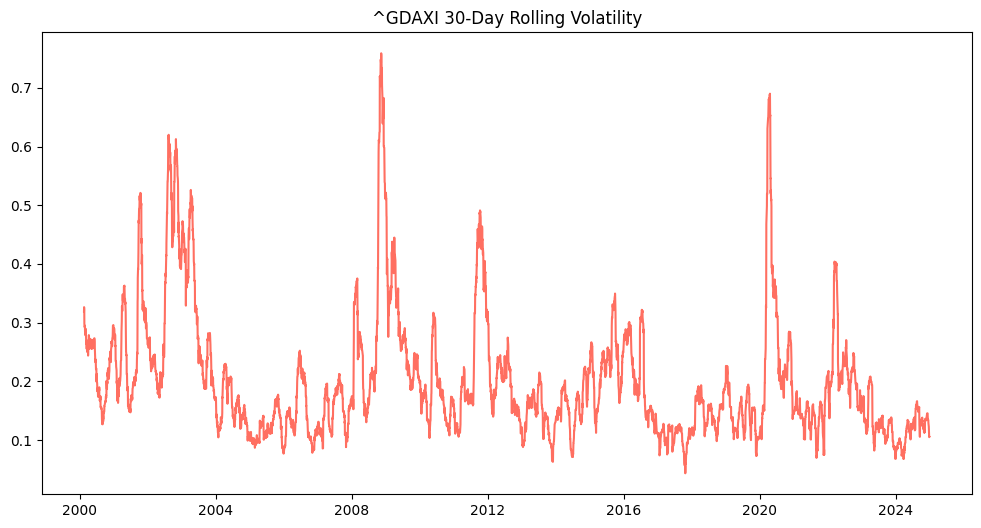

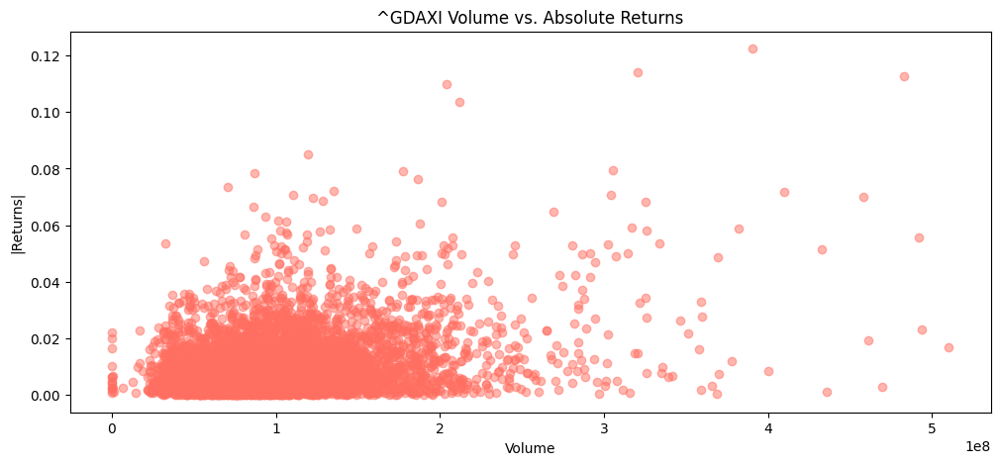

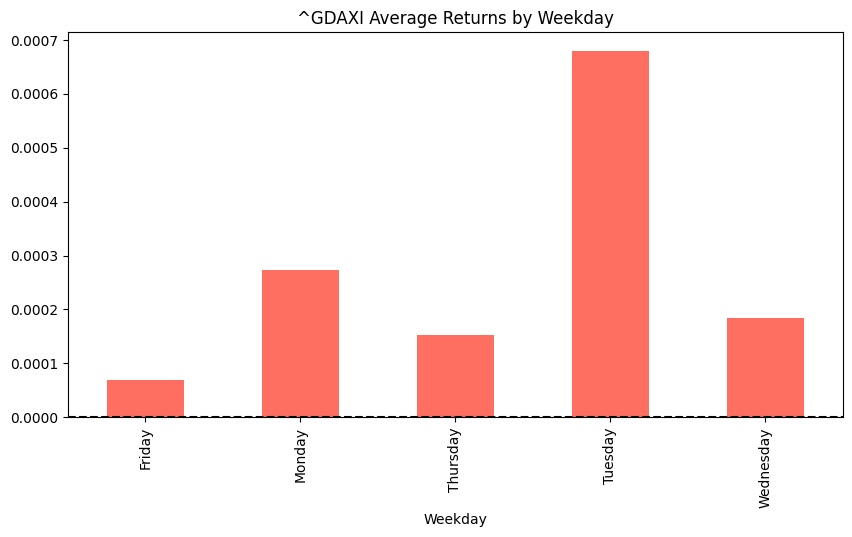


----------------------------------------
^GDAXI Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=0.42, p=0.9821

Shapiro-Wilk Test:
Stat=0.94, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0300

 Analyzing ^N225


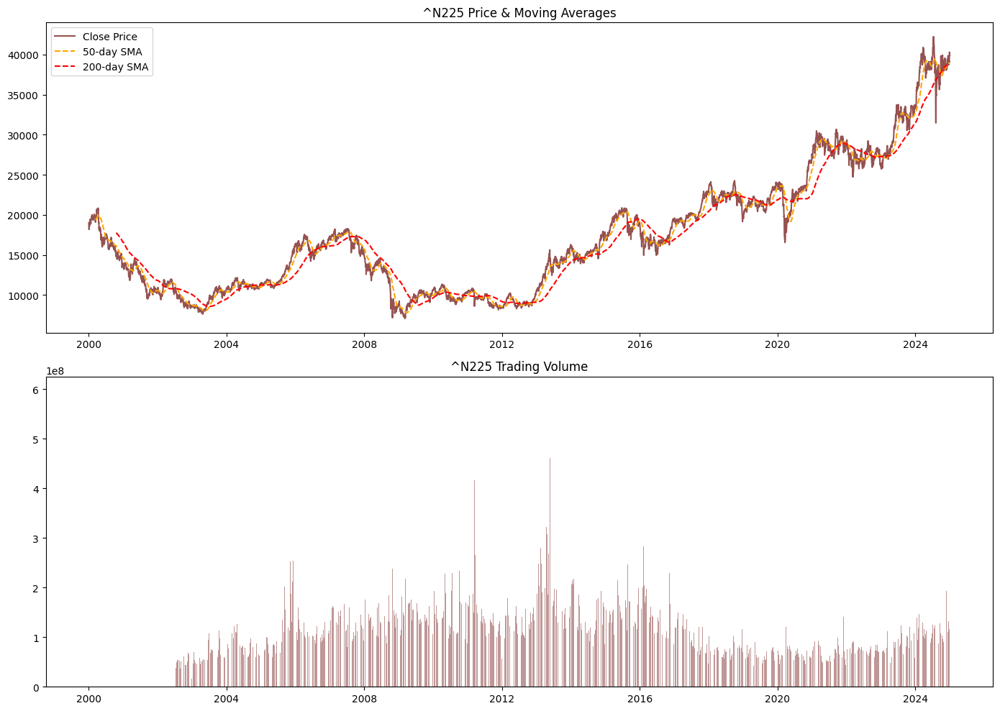

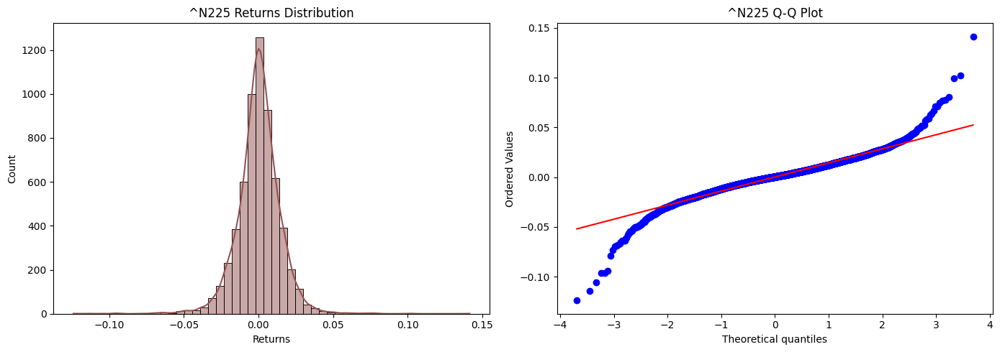

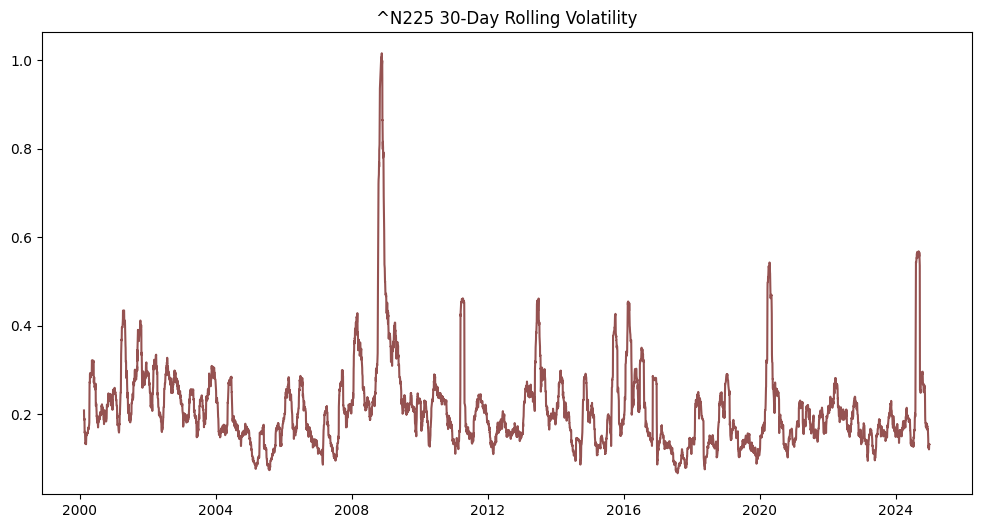

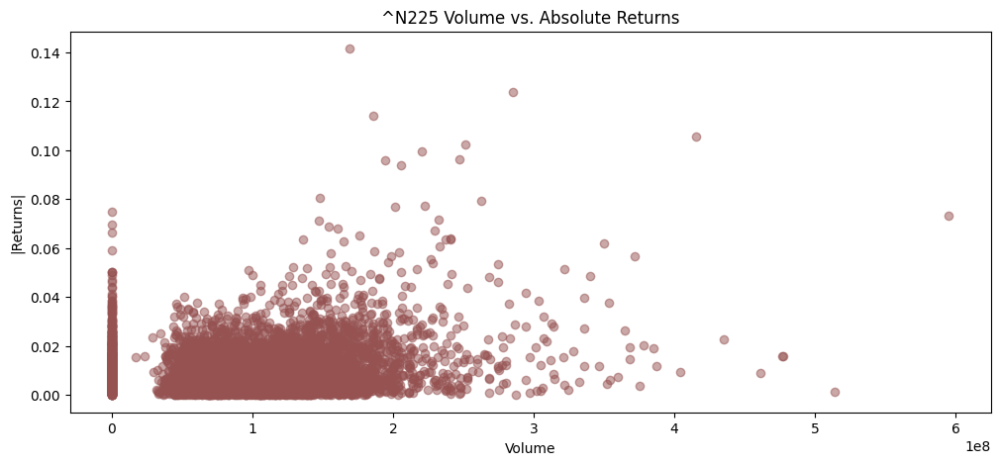

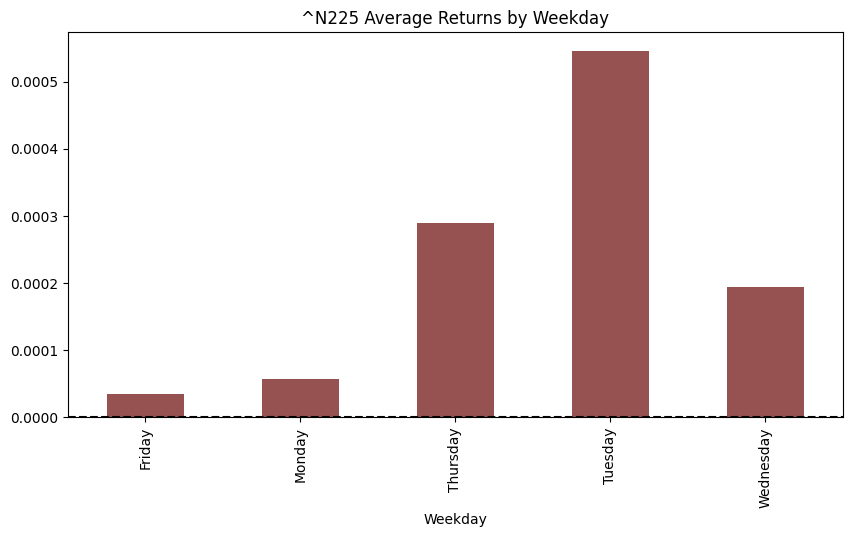


----------------------------------------
^N225 Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=0.54, p=0.9861

Shapiro-Wilk Test:
Stat=0.94, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0742

 Analyzing ^AXJO


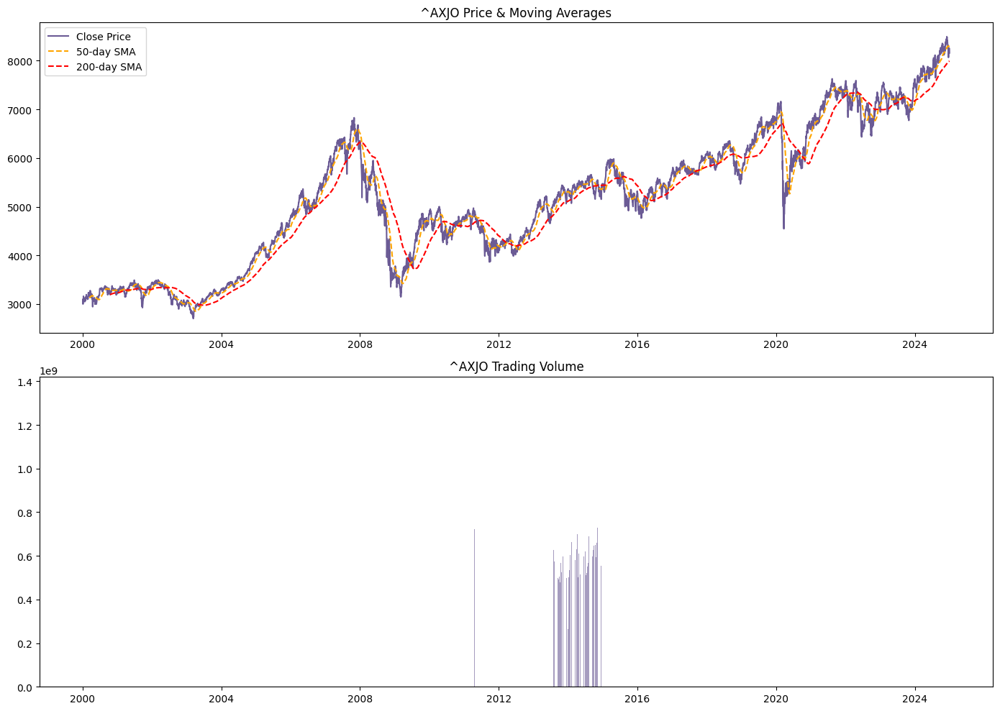

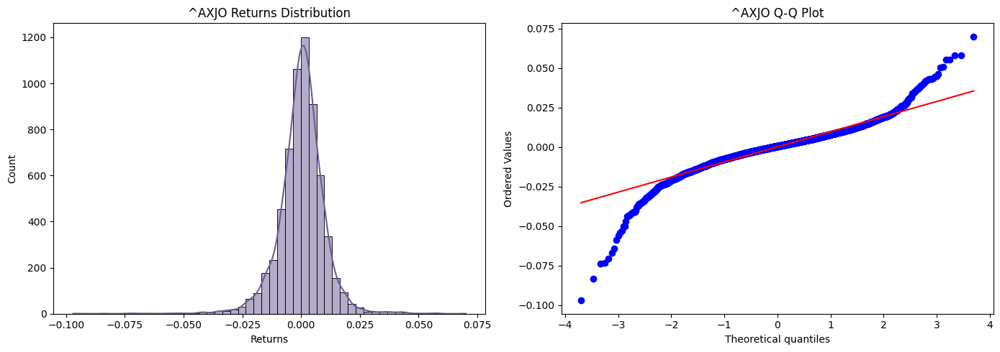

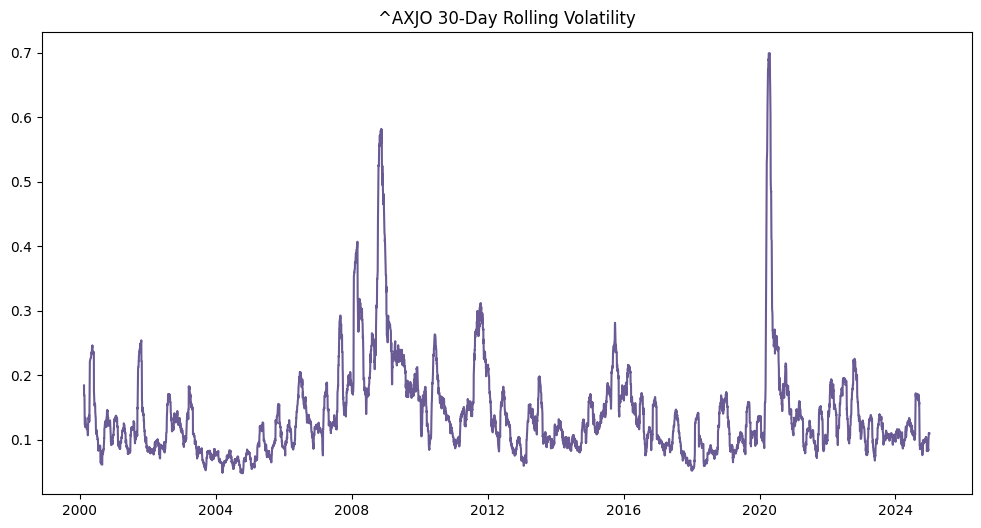

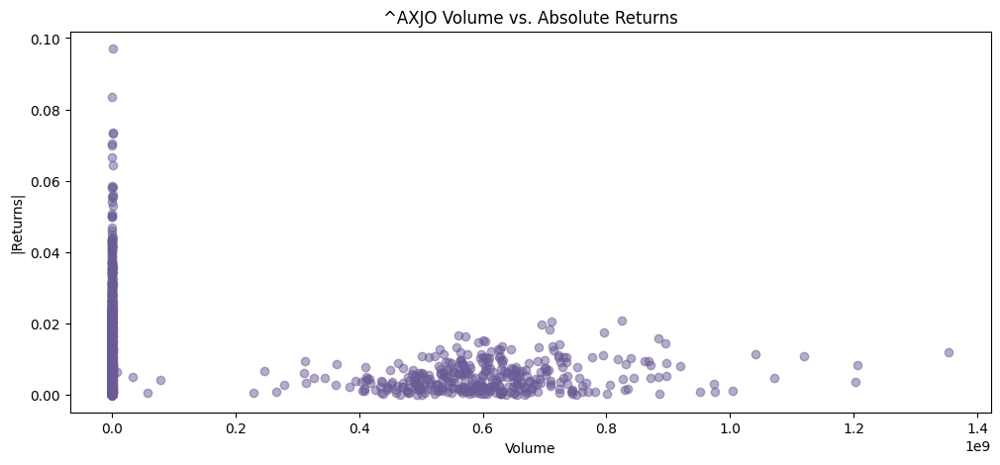

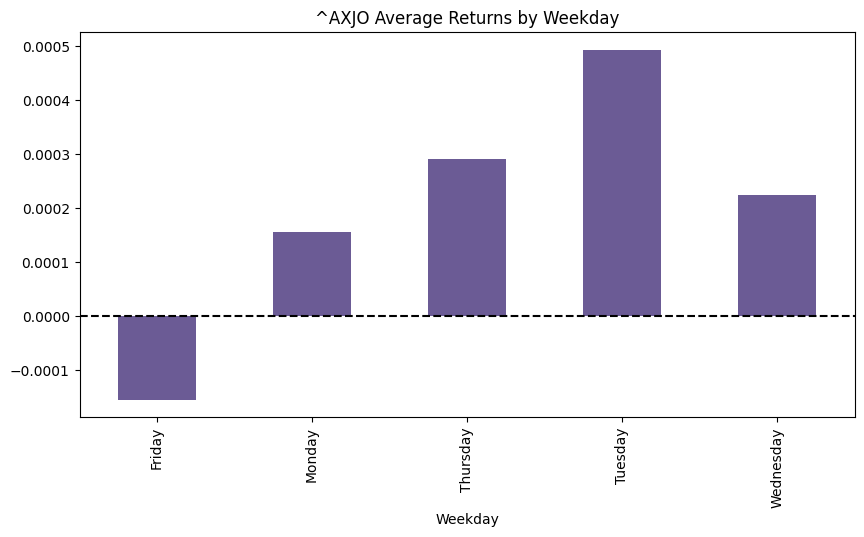


----------------------------------------
^AXJO Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=-1.00, p=0.7522

Shapiro-Wilk Test:
Stat=0.93, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0000


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from scipy.stats import shapiro, probplot
from statsmodels.stats.diagnostic import acorr_ljungbox
import plotly.io as pio

# Custom color palette for indices
COLOR_MAP = {
    '^GDAXI': '#FF6F61',    # Coral
    '^AXJO': '#6B5B95',     # Royal Purple
    '^FTSE': '#88B04B',     # Iguana Green
    '^GSPC': '#F7CAC9',     # Pale Pink
    '^GSPTSE': '#92A8D1',   # Soft Blue
    '^N225': '#955251'      # Mahogany
}

# Initialize Plotly template
pio.templates.default = "plotly_white"

def run_eda(ticker, df):
    """Run full EDA for a single index"""
    # Filter data for current ticker
    df = df[df['Ticker'] == ticker].set_index('Date')
    color = COLOR_MAP.get(ticker, '#333333')  # Fallback color

    # 1. Time Series Visualization -------------------------------------------------
    # Plotly Candlestick Chart
    fig = go.Figure(data=[go.Candlestick(
        x=df.index,
        open=df['Open'],
        high=df['High'],
        low=df['Low'],
        close=df['Close'],
        increasing_line_color=color,
        decreasing_line_color='gray'
    )])
    fig.update_layout(title=f'{ticker} Candlestick Chart', height=600)
    fig.show()

    # Matplotlib Plots
    fig, ax = plt.subplots(2, 1, figsize=(14, 10))
    ax[0].plot(df['Close'], color=color, label='Close Price')
    df['SMA50'] = df['Close'].rolling(50).mean()
    df['SMA200'] = df['Close'].rolling(200).mean()
    ax[0].plot(df['SMA50'], '--', color='orange', label='50-day SMA')
    ax[0].plot(df['SMA200'], '--', color='red', label='200-day SMA')
    ax[0].set_title(f'{ticker} Price & Moving Averages')
    ax[0].legend()

    ax[1].bar(df.index, df['Volume'], color=color, alpha=0.6)
    ax[1].set_title(f'{ticker} Trading Volume')
    plt.tight_layout()
    plt.show()

    # 2. Distribution Analysis -----------------------------------------------------
    df['Returns'] = df['Close'].pct_change().dropna()

    plt.figure(figsize=(14, 5))
    plt.subplot(121)
    sns.histplot(df['Returns'], bins=50, kde=True, color=color)
    plt.title(f'{ticker} Returns Distribution')

    plt.subplot(122)
    probplot(df['Returns'].dropna(), plot=plt)
    plt.title(f'{ticker} Q-Q Plot')
    plt.tight_layout()
    plt.show()

    # 3. Volatility Analysis -------------------------------------------------------
    df['Volatility'] = df['Returns'].rolling(30).std() * np.sqrt(252)

    plt.figure(figsize=(12, 6))
    plt.plot(df['Volatility'], color=color)
    plt.title(f'{ticker} 30-Day Rolling Volatility')
    plt.show()

    # 4. Correlation Analysis ------------------------------------------------------
    df['Abs_Returns'] = df['Returns'].abs()

    plt.figure(figsize=(12, 5))
    plt.scatter(df['Volume'], df['Abs_Returns'], color=color, alpha=0.5)
    plt.title(f'{ticker} Volume vs. Absolute Returns')
    plt.xlabel('Volume')
    plt.ylabel('|Returns|')
    plt.show()

    # 5. Seasonality Analysis ------------------------------------------------------
    df['Weekday'] = df.index.day_name()
    weekday_means = df.groupby('Weekday')['Returns'].mean()

    plt.figure(figsize=(10, 5))
    weekday_means.plot(kind='bar', color=[color]*7)
    plt.title(f'{ticker} Average Returns by Weekday')
    plt.axhline(0, color='black', linestyle='--')
    plt.show()

    # 6. Statistical Tests ---------------------------------------------------------
    print(f"\n{'-'*40}\n{ticker} Statistical Tests\n{'-'*40}")

    # Stationarity
    adf_result = adfuller(df['Close'].dropna())
    print(f"ADF Test (Close Price):\nStat={adf_result[0]:.2f}, p={adf_result[1]:.4f}")

    # Normality
    shapiro_stat, shapiro_p = shapiro(df['Returns'].dropna())
    print(f"\nShapiro-Wilk Test:\nStat={shapiro_stat:.2f}, p={shapiro_p:.4f}")

    ljung_results = acorr_ljungbox(df['Returns'].dropna(), lags=10)
    ljung_p = ljung_results['lb_pvalue'].iloc[-1]  # Proper pandas indexing
    print(f"\nLjung-Box Test (lag=10):\np-value={ljung_p:.4f}")

# Main Execution ----------------------------------------------------------------
# Get unique tickers from DataFrame
tickers = developed_df['Ticker'].unique()

# Run EDA for each index
for ticker in tickers:
    print(f"\n{'='*60}\n Analyzing {ticker}\n{'='*60}")
    run_eda(ticker, developed_df)

In [ ]:
emerging_df['Date']=pd.to_datetime(emerging_df['Date'])


 Analyzing ^BVSP


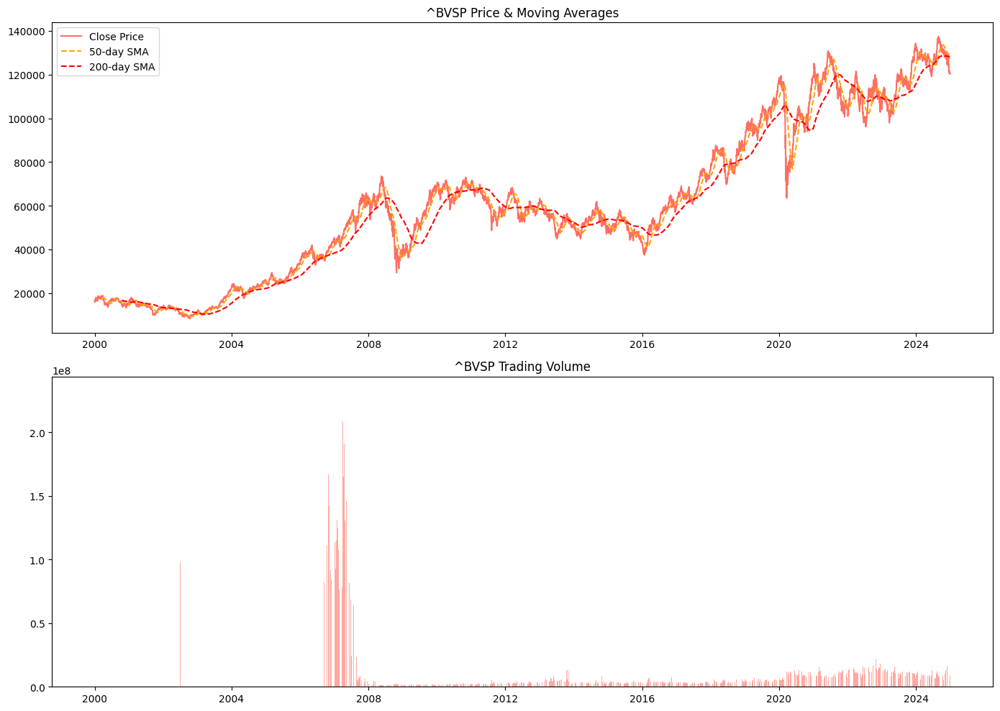

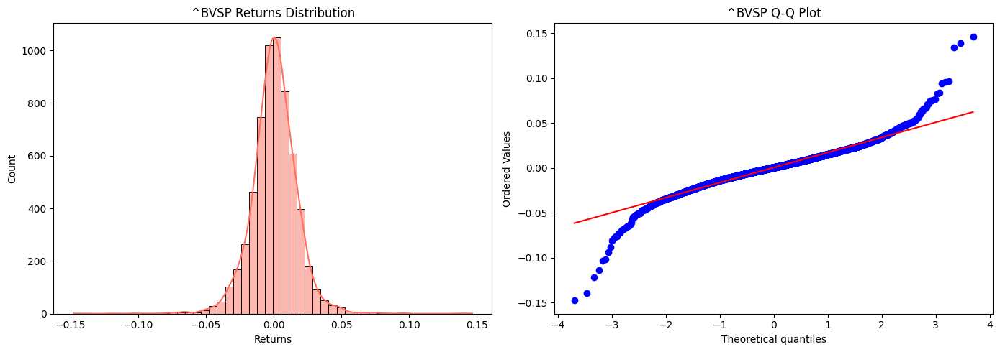

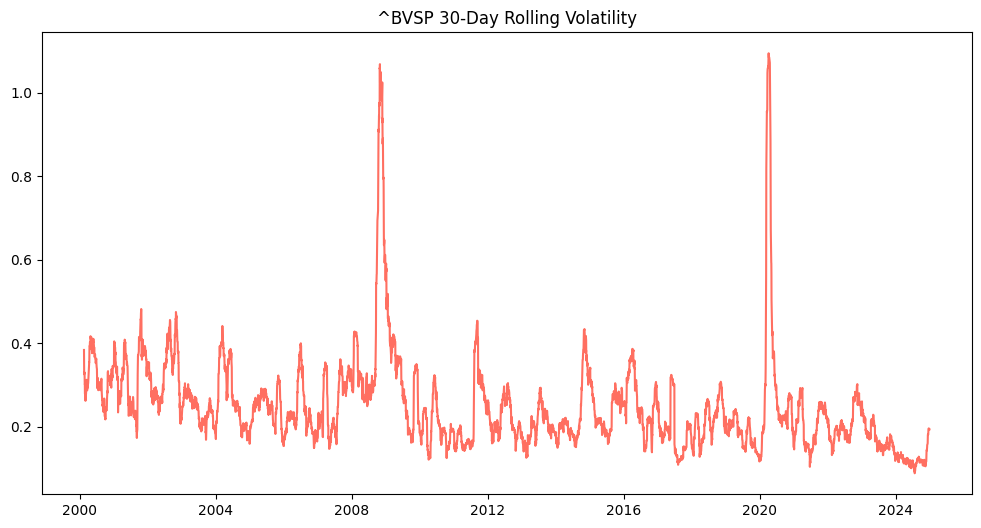

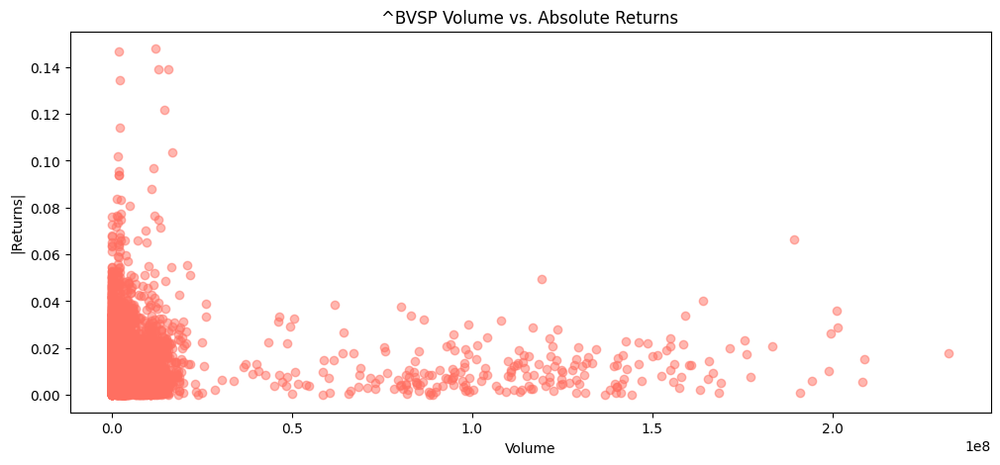

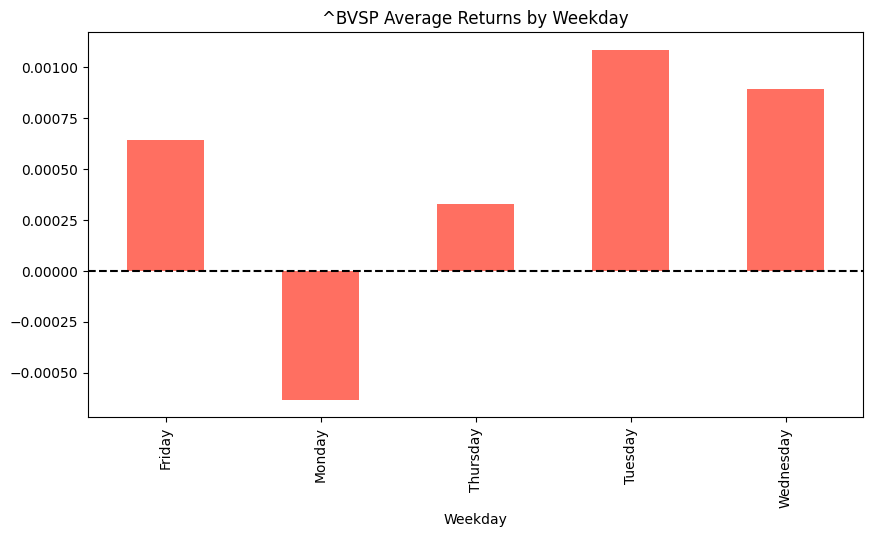


----------------------------------------
^BVSP Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=-0.94, p=0.7730

Shapiro-Wilk Test:
Stat=0.95, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0041

 Analyzing ^IGPA


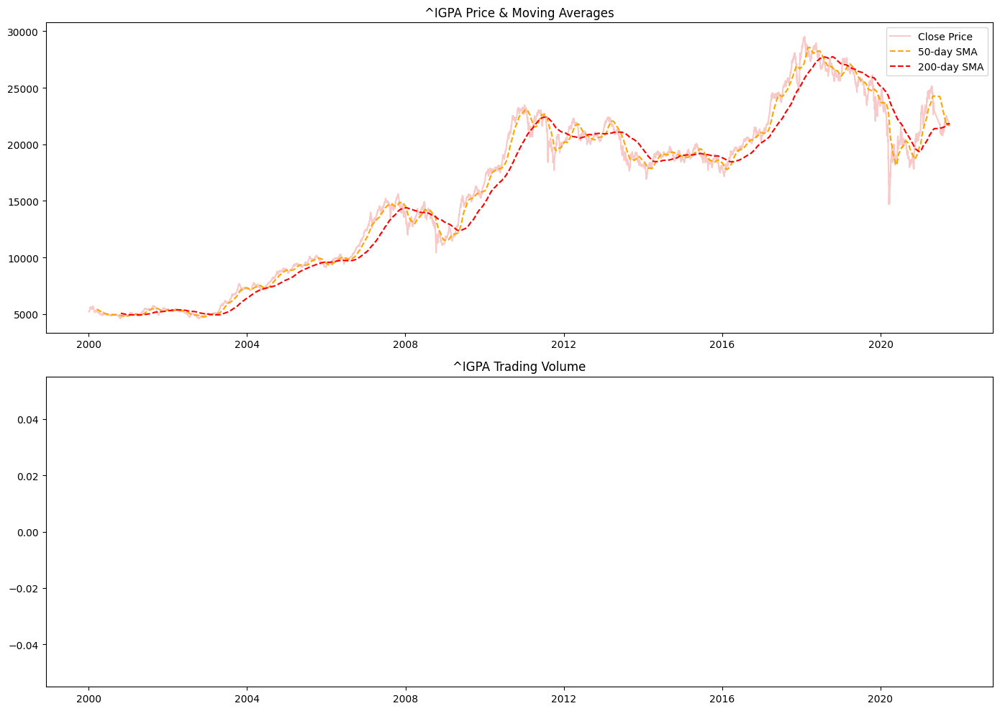

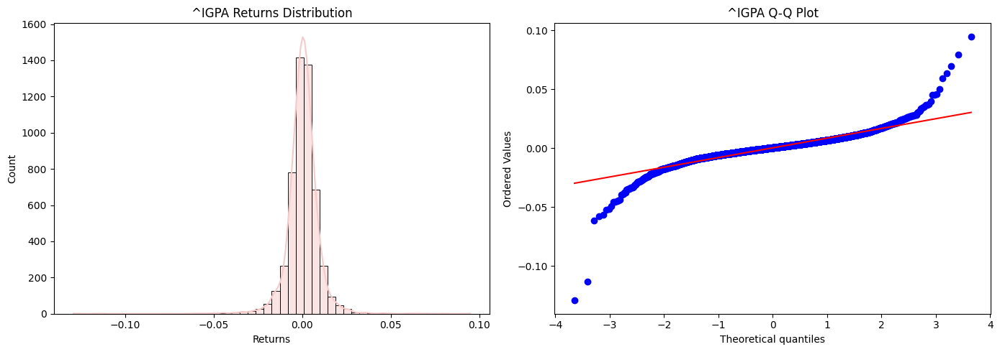

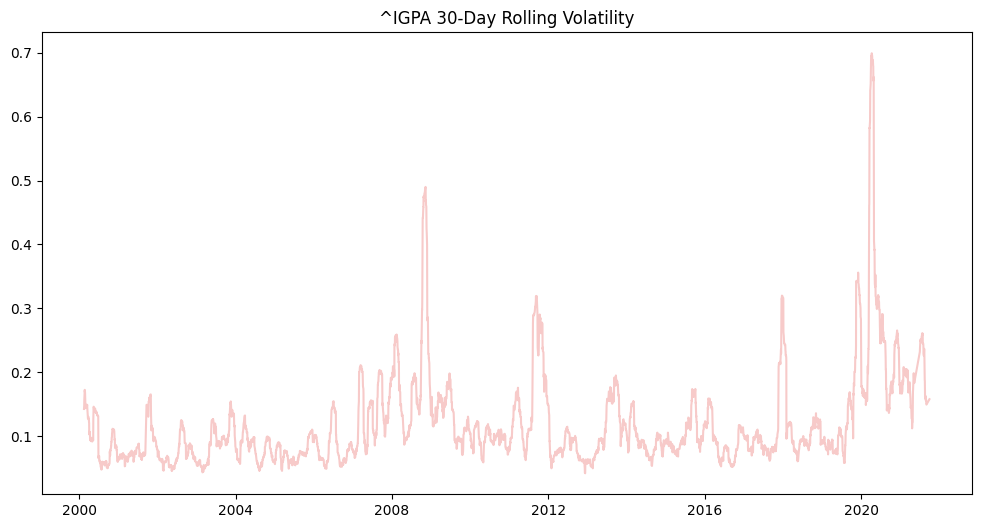

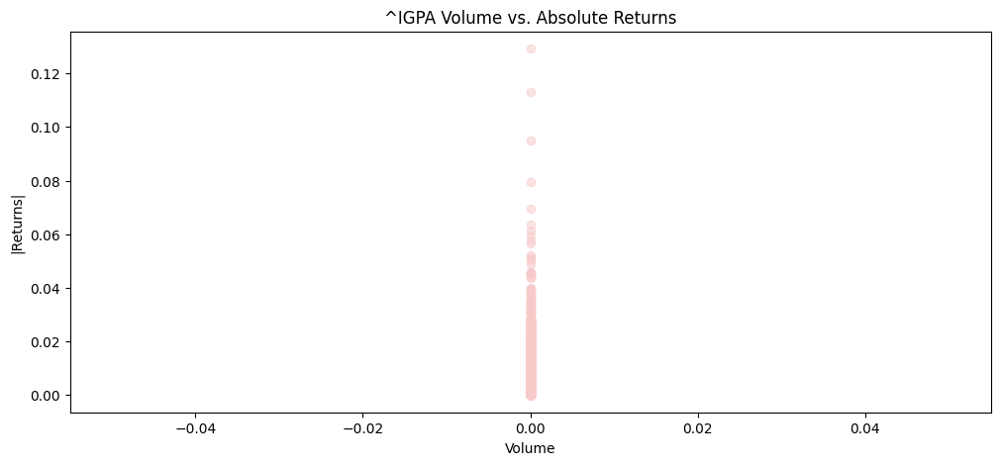

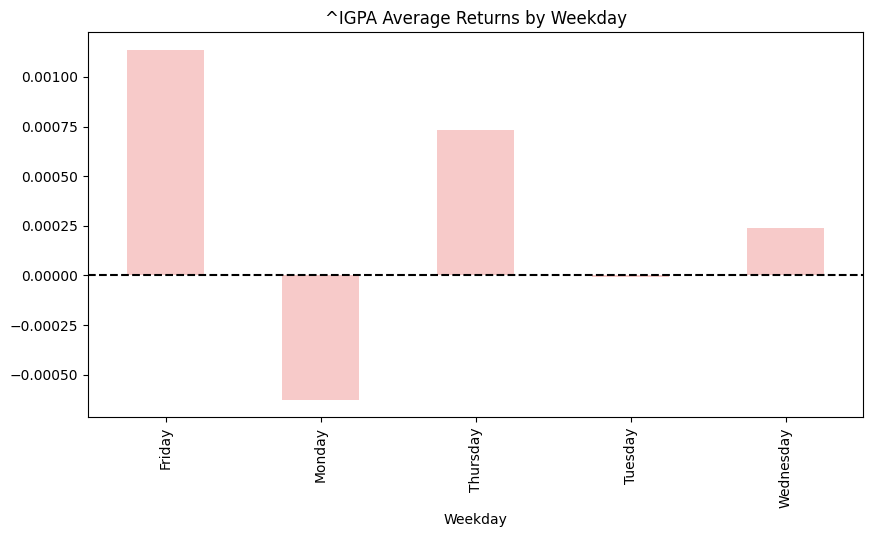


----------------------------------------
^IGPA Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=-1.35, p=0.6058

Shapiro-Wilk Test:
Stat=0.87, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0000

 Analyzing ASE


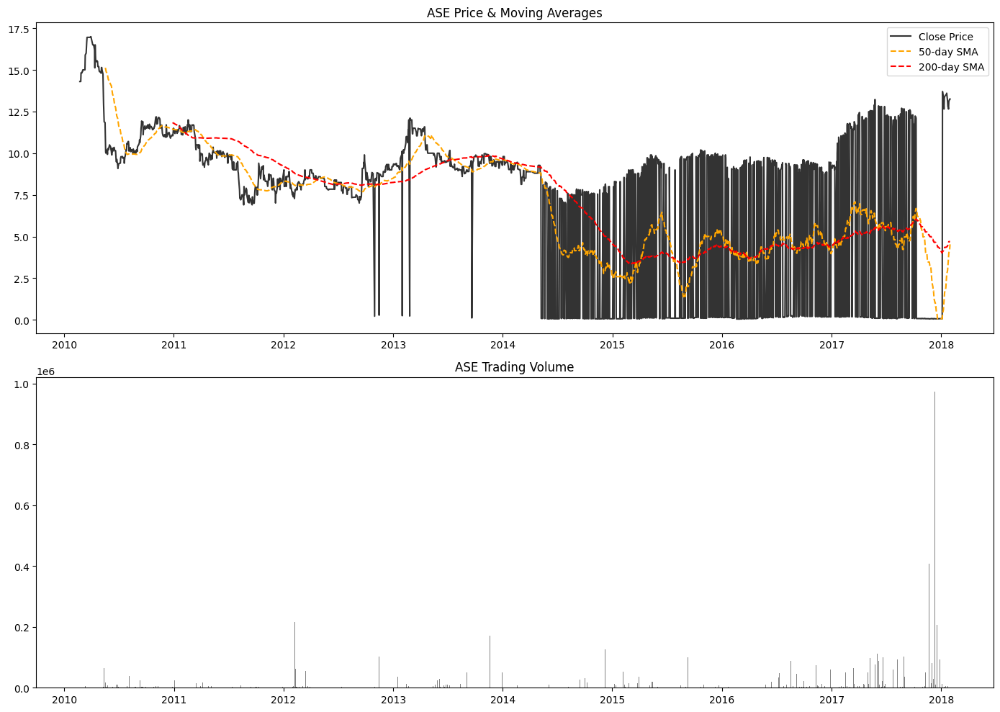

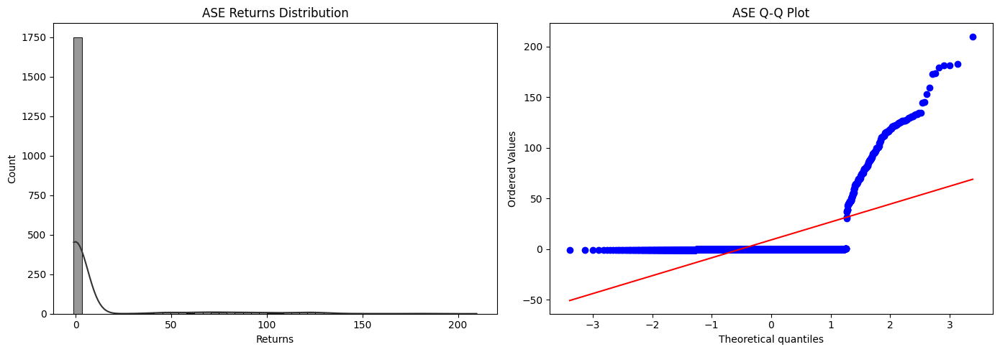

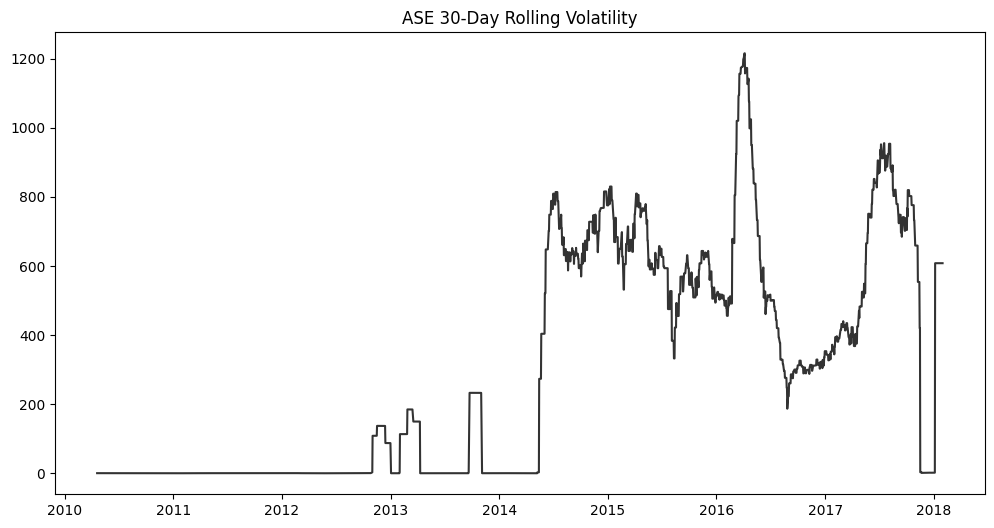

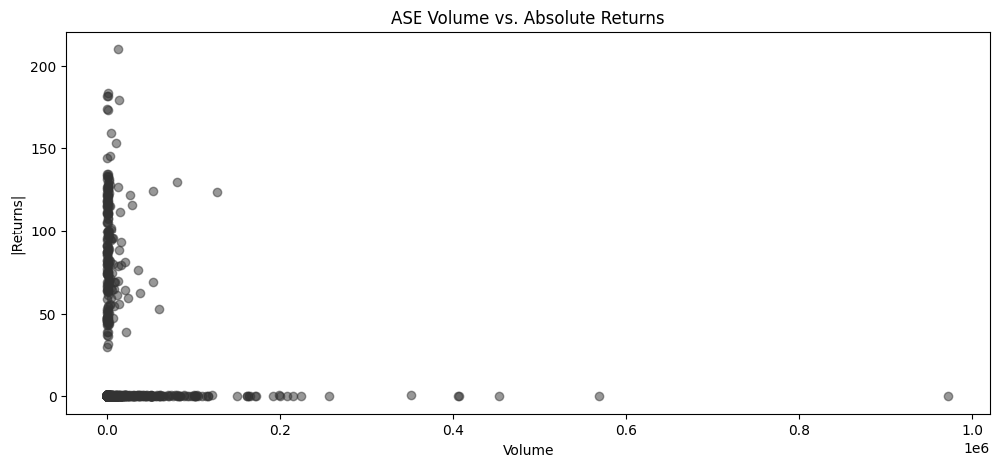

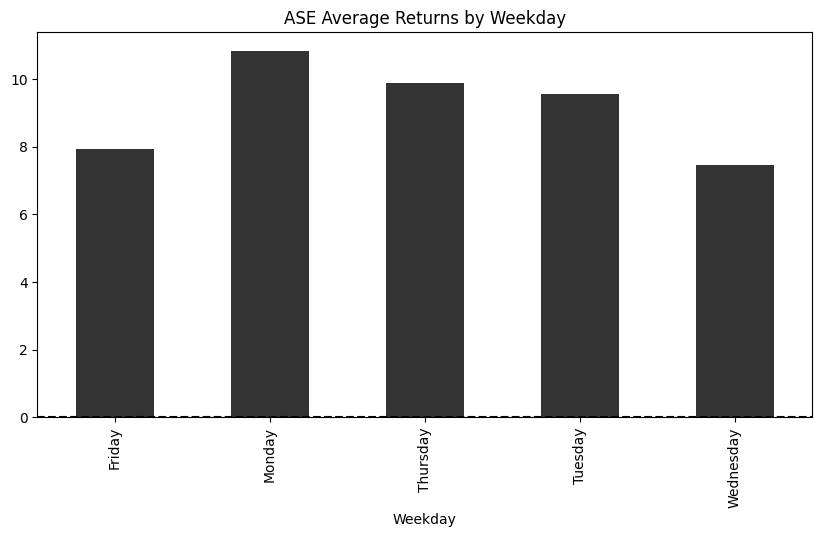


----------------------------------------
ASE Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=-3.44, p=0.0097

Shapiro-Wilk Test:
Stat=0.36, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0000

 Analyzing ^QSI


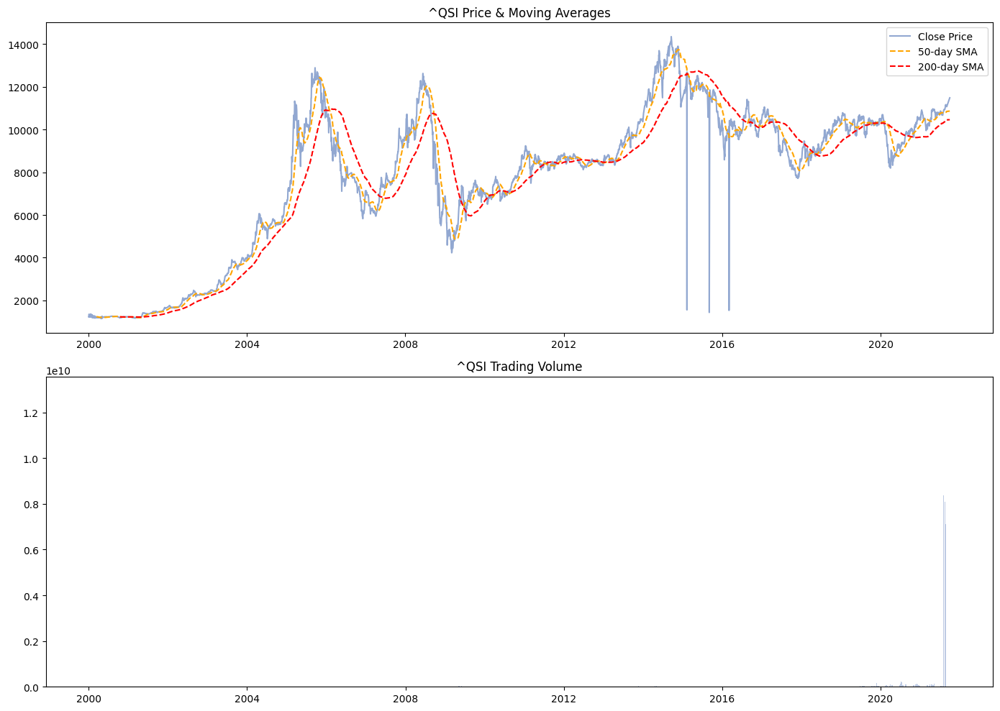

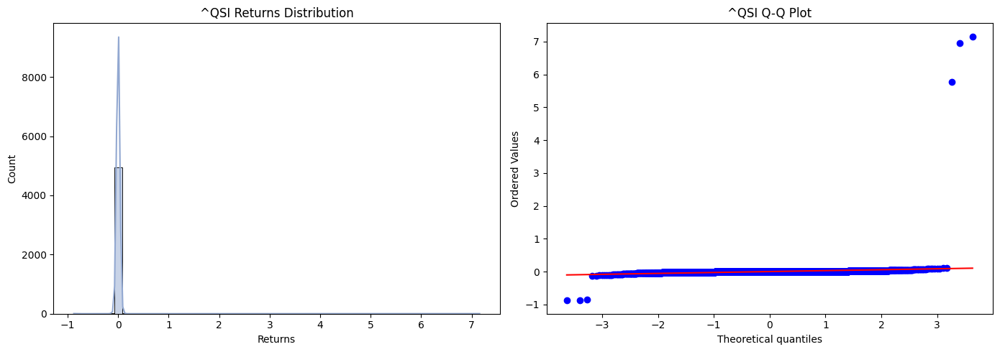

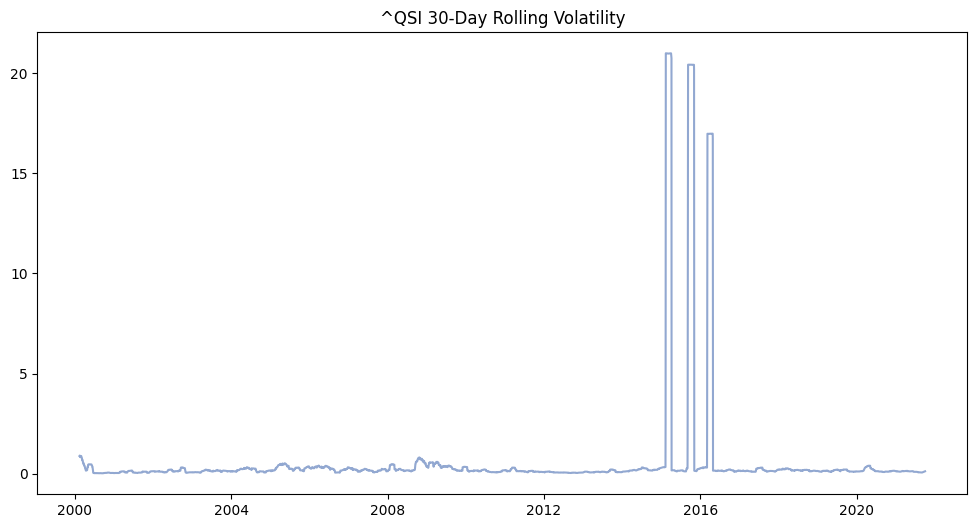

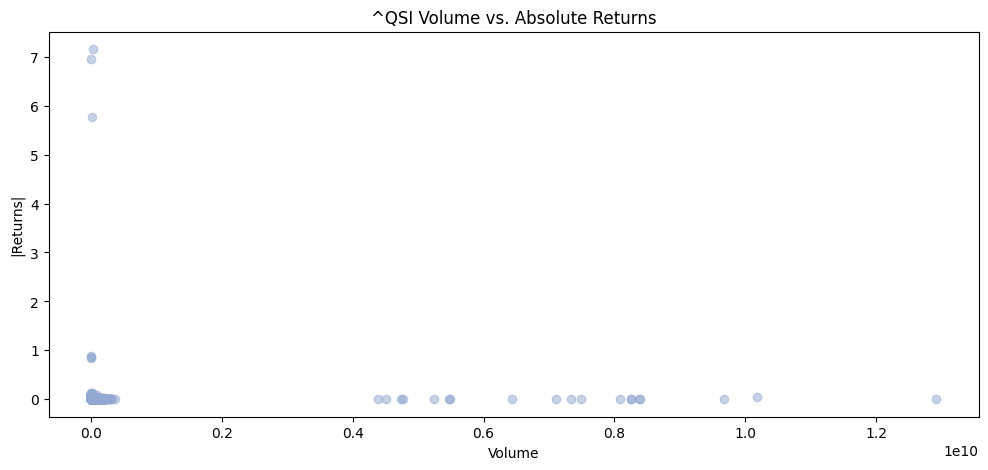

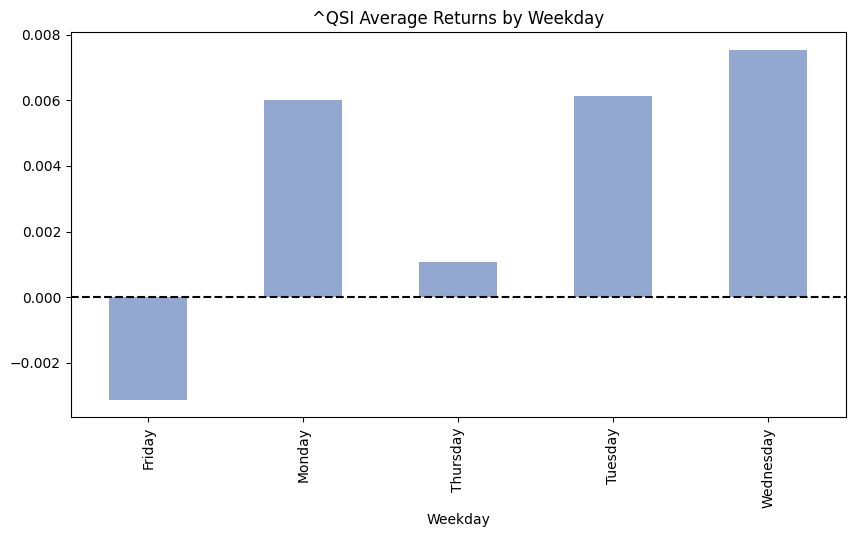


----------------------------------------
^QSI Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=-1.78, p=0.3916

Shapiro-Wilk Test:
Stat=0.03, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0000

 Analyzing 000001.SS


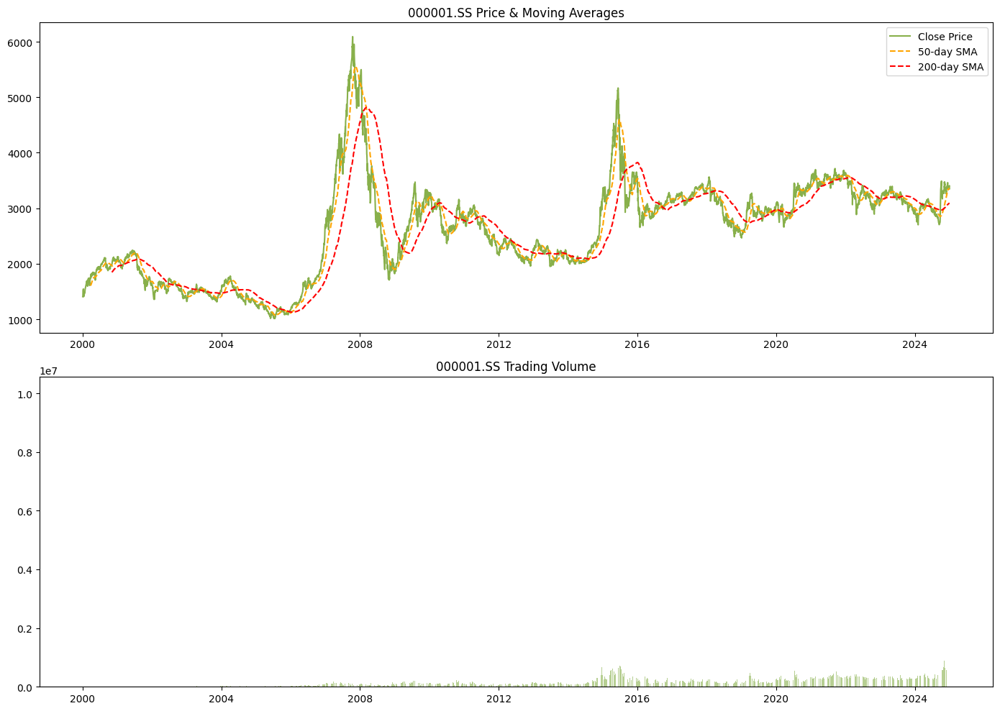

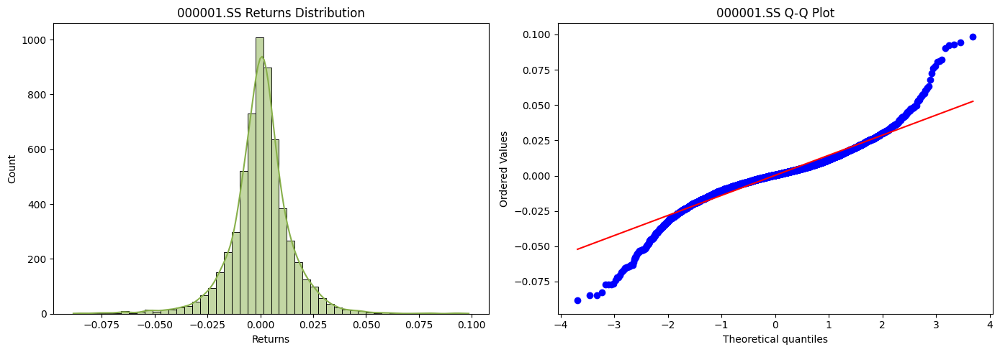

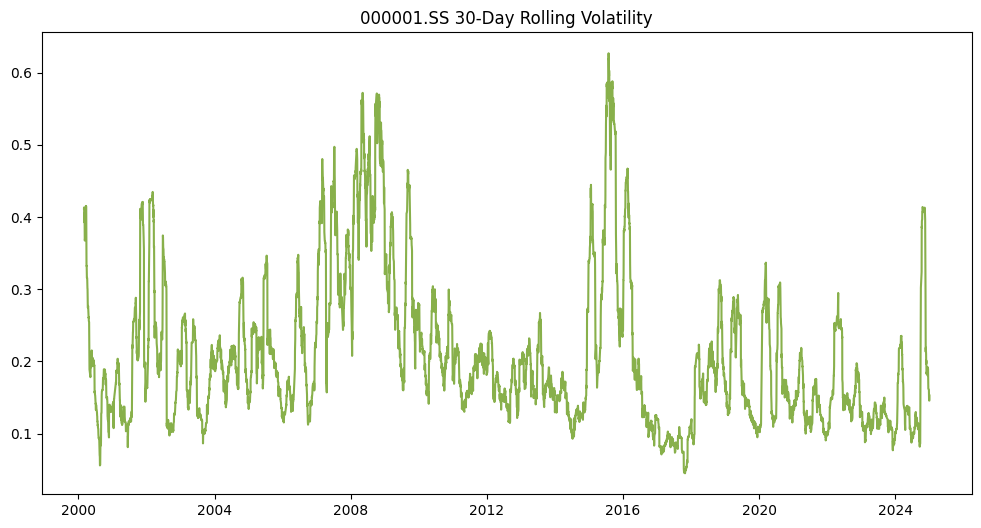

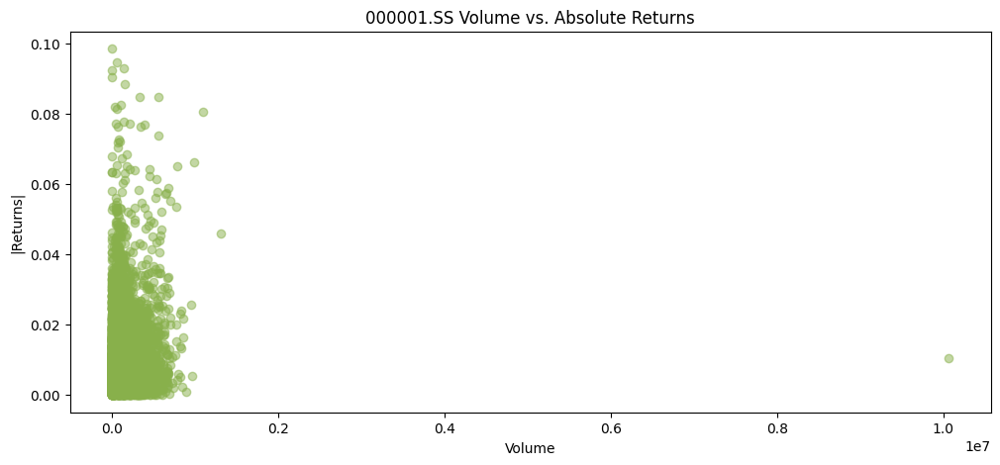

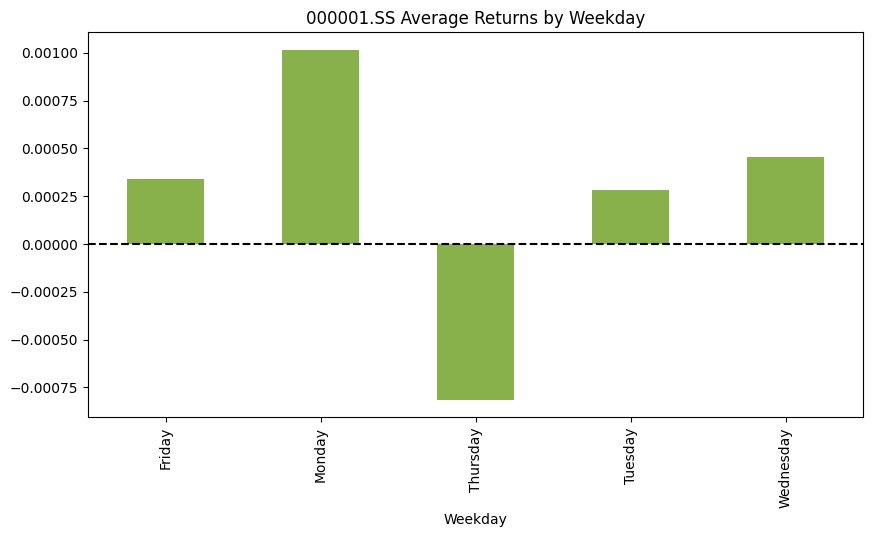


----------------------------------------
000001.SS Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=-2.36, p=0.1544

Shapiro-Wilk Test:
Stat=0.93, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0000

 Analyzing ^BSESN


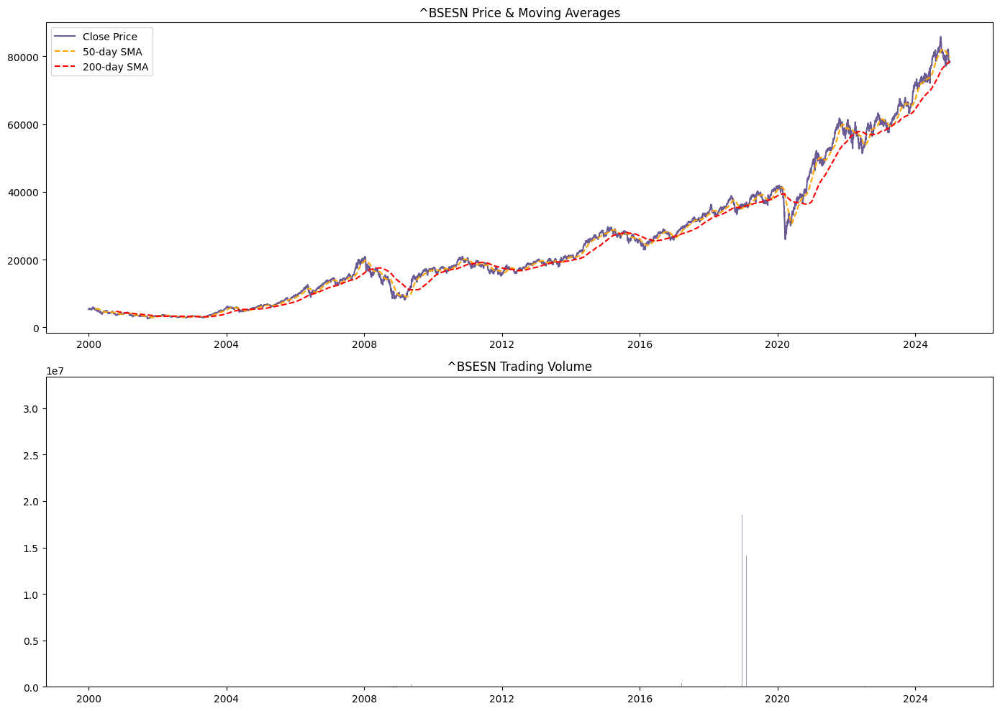

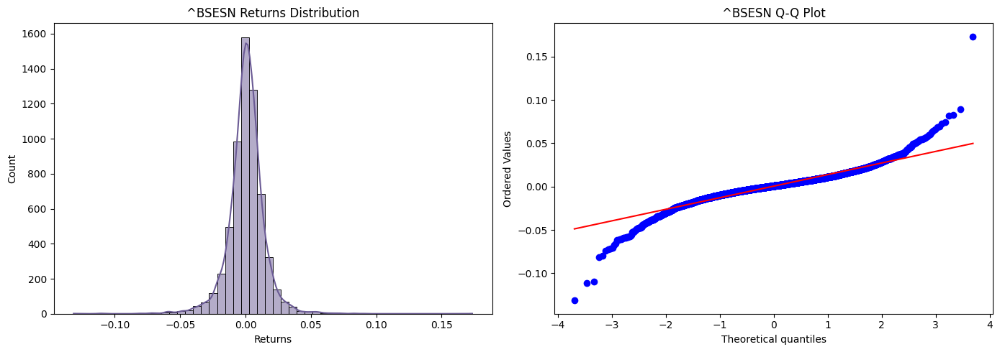

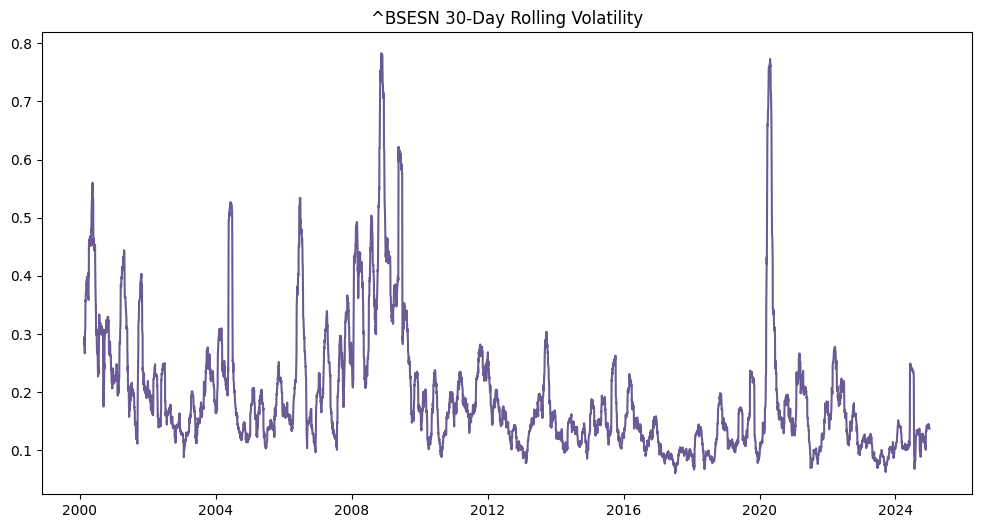

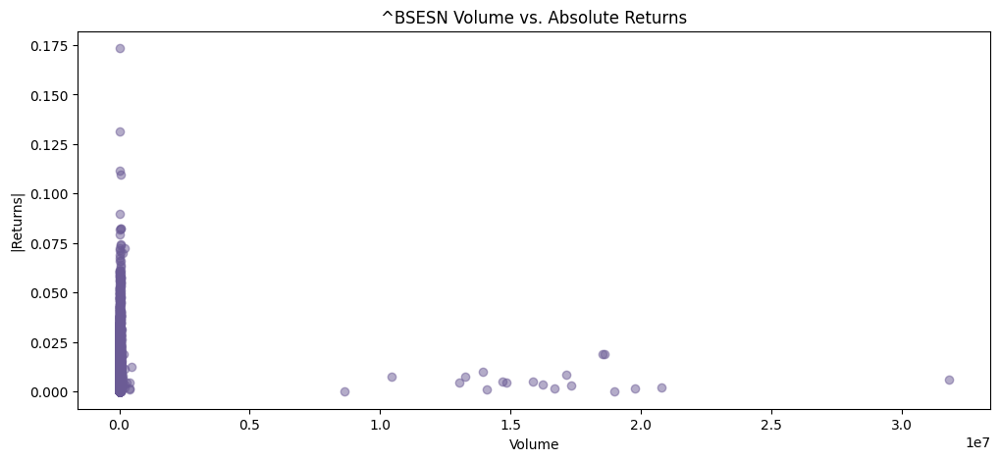

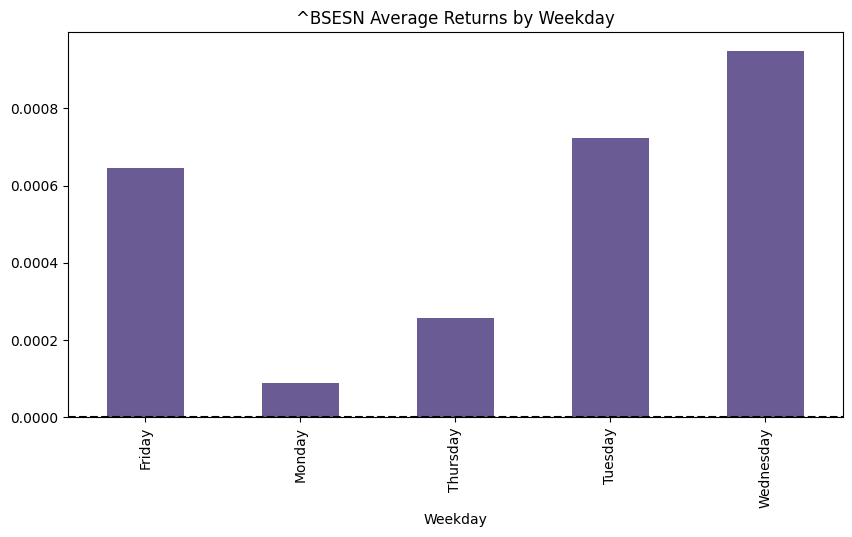


----------------------------------------
^BSESN Statistical Tests
----------------------------------------
ADF Test (Close Price):
Stat=1.82, p=0.9984

Shapiro-Wilk Test:
Stat=0.92, p=0.0000

Ljung-Box Test (lag=10):
p-value=0.0000


In [ ]:
# Custom color palette for indices
COLOR_MAP = {
    '^BVSP': '#FF6F61',    # Coral
    '^BSESN': '#6B5B95',     # Royal Purple
    '000001.SS': '#88B04B',     # Iguana Green
    '^IGPA': '#F7CAC9',     # Pale Pink
    '^QSI': '#92A8D1',   # Soft Blue
    '^ASE': '#955251'      # Mahogany
}

tickers = emerging_df['Ticker'].unique()

# Run EDA for each index
for ticker in tickers:
    print(f"\n{'='*60}\n Analyzing {ticker}\n{'='*60}")
    run_eda(ticker, emerging_df)